In [20]:
import pandas as pd
import matplotlib as plt
import wordcloud as wc
import matplotlib.pyplot as plt

In [21]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

In [22]:
df = pd.read_csv("sentiment_tweets.csv",encoding = 'latin1',header=None, names=['target','id','date','flag','user','text'])
df = df[['target','text']]
df

,target,text
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,is upset that he can't update his Facebook by ...
2,0,@Kenichan I dived many times for the ball. Man...
3,0,my whole body feels itchy and like its on fire
4,0,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,4,Just woke up. Having no school is the best fee...
1599996,4,TheWDB.com - Very cool to hear old Walt interv...
1599997,4,Are you ready for your MoJo Makeover? Ask me f...
1599998,4,Happy 38th Birthday to my boo of alll time!!! ...


In [ ]:
## Multi Process 활용해서 구현해보기

# from concurrent.futures import ProcessPoolExecutor
# import pandas as pd
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize

# # 불용어 리스트
# stop_words = set(stopwords.words('english'))

# # 토큰화 및 불용어 제거 함수
# def tokenize_and_remove_stopwords(text):
#     return [token.lower() for token in word_tokenize(text) if token.lower() not in stop_words]

# # ProcessPoolExecutor를 사용한 병렬 처리 함수
# def parallel_apply_with_futures(df, func, column_name, new_column_name):
#     with ProcessPoolExecutor() as executor:
#         df[new_column_name] = list(executor.map(func, df[column_name]))
#     return df

# # 예제 DataFrame
# data = {
#     "text": [
#         "This is a sample text.",
#         "Another example of text processing!",
#         "Natural Language Processing is amazing.",
#         "Let's remove stop words and tokenize."
#     ]
# }
# df = pd.DataFrame(data)

# # 병렬 처리 적용
# df = parallel_apply_with_futures(df, tokenize_and_remove_stopwords, column_name="text", new_column_name="tokens")

# # 결과 출력
# print(df)


## nltk 라이브러리의 토큰 기능으로 토큰화 함

In [23]:
positive=[]
negative=[]

In [24]:

# 불용어 리스트
stop_words = set(stopwords.words('english'))


In [25]:
# 토큰화 후 불용어 제거
df['tokens'] = df['text'].apply(lambda x: [token.lower() for token in word_tokenize(x) if token.lower() not in stop_words])
df
#멀티프로세싱 안하면 1분 48초 나옴

,target,text,tokens
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t...","[@, switchfoot, http, :, //twitpic.com/2y1zl, ..."
1,0,is upset that he can't update his Facebook by ...,"[upset, ca, n't, update, facebook, texting, ....."
2,0,@Kenichan I dived many times for the ball. Man...,"[@, kenichan, dived, many, times, ball, ., man..."
3,0,my whole body feels itchy and like its on fire,"[whole, body, feels, itchy, like, fire]"
4,0,"@nationwideclass no, it's not behaving at all....","[@, nationwideclass, ,, 's, behaving, ., 'm, m..."
...,...,...,...
1599995,4,Just woke up. Having no school is the best fee...,"[woke, ., school, best, feeling, ever]"
1599996,4,TheWDB.com - Very cool to hear old Walt interv...,"[thewdb.com, -, cool, hear, old, walt, intervi..."
1599997,4,Are you ready for your MoJo Makeover? Ask me f...,"[ready, mojo, makeover, ?, ask, details]"
1599998,4,Happy 38th Birthday to my boo of alll time!!! ...,"[happy, 38th, birthday, boo, alll, time, !, !,..."


In [26]:
# df의 각 행을 반복
for index, row in df.iterrows():
    #print(row['target'],row['tokens'])  # 각 행을 출력
    if row['target']==0:
        for word in row['tokens']:
            if len(word)>2  and len(word)<15:
                negative.append(word)
    if row['target']==4:
        for word in row['tokens']:
            if len(word)>2 and len(word)<15:
                positive.append(word)        
#print(negative)

In [27]:
neg_num = {}

for word in negative:
    if word in neg_num:
        neg_num[word]+=1
    else:
        neg_num[word]=1

pos_num = {}

for word in positive:
    if word in pos_num:
        pos_num[word]+=1
    else:
        pos_num[word]=1



In [28]:
print(neg_num)


{'switchfoot': 13, 'http': 24334, 'awww': 3398, 'bummer': 1411, 'shoulda': 271, 'got': 38544, 'david': 1111, 'carr': 27, 'third': 448, 'day': 38926, 'upset': 2501, "n't": 120835, 'update': 2476, 'facebook': 2006, 'texting': 366, '...': 122813, 'might': 4733, 'cry': 3876, 'result': 306, 'school': 12775, 'today': 37879, 'also': 4719, 'blah': 1257, 'kenichan': 7, 'dived': 3, 'many': 4690, 'times': 3856, 'ball': 685, 'managed': 524, 'save': 1273, 'rest': 2572, 'bounds': 9, 'whole': 3443, 'body': 1701, 'feels': 3455, 'itchy': 411, 'like': 40929, 'fire': 774, 'behaving': 38, 'mad': 2837, 'see': 20500, 'kwesidei': 1, 'crew': 289, 'need': 22248, 'hug': 1328, 'loltrish': 1, 'hey': 5018, 'long': 9425, 'time': 27291, 'yes': 5842, 'rains': 363, 'bit': 5493, 'lol': 22951, 'fine': 1587, 'thanks': 5778, 'tatiana_k': 6, 'nope': 1625, 'twittera': 3, 'que': 309, 'muera': 1, 'spring': 487, 'break': 2575, 'plain': 224, 'city': 1701, 'snowing': 112, 're-pierced': 1, 'ears': 502, 'caregiving': 1, 'could': 1

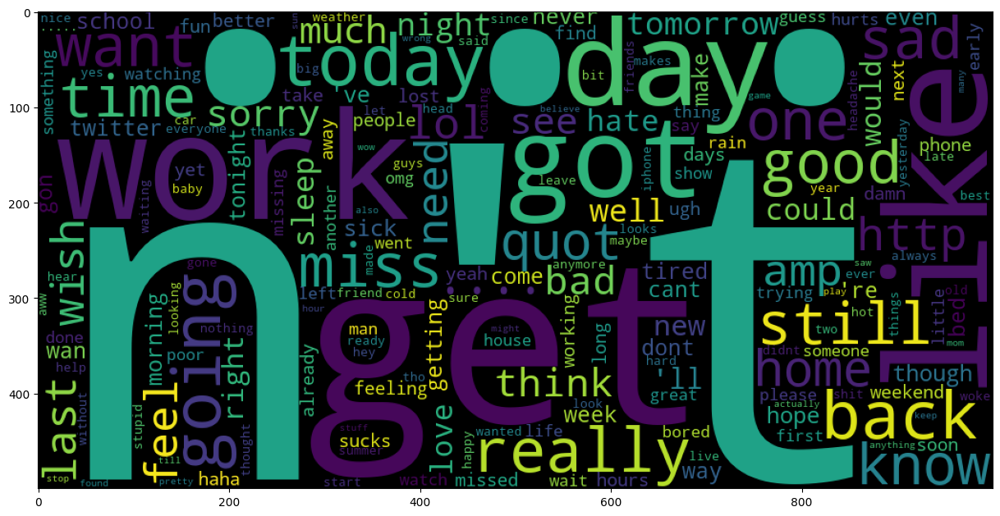

In [29]:

import matplotlib.pyplot as plt
from wordcloud import WordCloud

neg_cloud = WordCloud(width = 1000, height = 500,max_words=200).generate_from_frequencies(neg_num)

plt.figure(figsize=(15,8))
plt.imshow(neg_cloud)

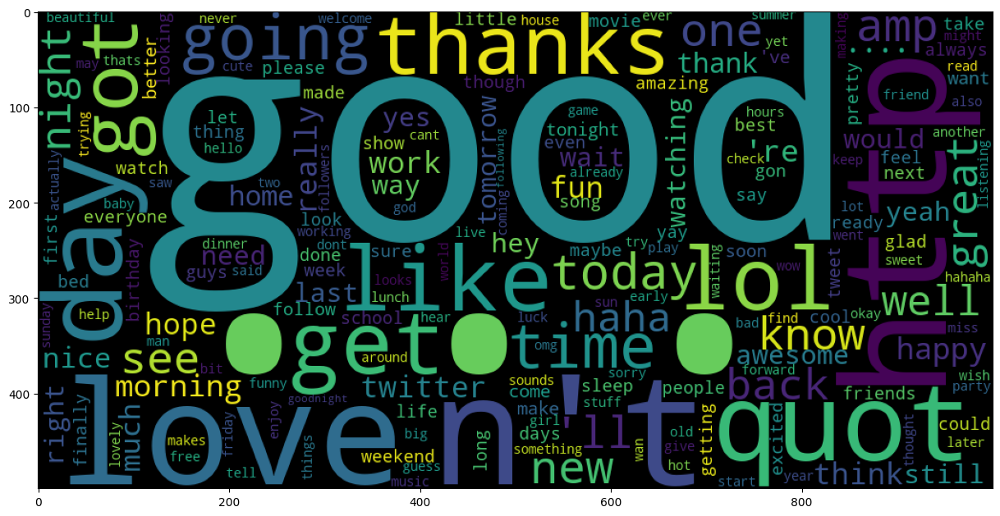

In [30]:



pos_cloud = WordCloud(width = 1000, height = 500,max_words=200).generate_from_frequencies(pos_num)

plt.figure(figsize=(15,8))
plt.imshow(pos_cloud)

## 단순 띄어쓰기 단위로 token화함

In [31]:
neg_df = df[df['target']==0]


# Assuming `neg_df` is a pandas DataFrame with a column of text
neg_df = neg_df['text'].apply(lambda x: [token.lower() for token in x.split() if token.lower() not in stop_words])
# Display the modified DataFrame
print(neg_df)



0         [@switchfoot, http://twitpic.com/2y1zl, -, aww...
1         [upset, can't, update, facebook, texting, it.....
2         [@kenichan, dived, many, times, ball., managed...
3                   [whole, body, feels, itchy, like, fire]
4         [@nationwideclass, no,, behaving, all., i'm, m...
                                ...                        
799995    [sick, spending, day, laying, bed, listening, ...
799996                                       [gmail, down?]
799997                          [rest, peace, farrah!, sad]
799998    [@eric_urbane, sounds, like, rival, flagging, ...
799999    [resit, exams, summer..., wishes, worked, hard...
Name: text, Length: 800000, dtype: object


In [32]:
neg_list=[]
for row in neg_df:
    for word in row:
        if len(word)>2 and len(word)<15:
            neg_list.append(word)

#print(neg_list)

{'@switchfoot': 7, 'awww,': 368, "that's": 8784, 'bummer.': 276, 'shoulda': 255, 'got': 32860, 'david': 920, 'carr': 19, 'third': 413, 'day': 28487, 'it.': 7375, 'upset': 2009, "can't": 30613, 'update': 1920, 'facebook': 1467, 'texting': 309, 'it...': 909, 'might': 4634, 'cry': 2624, 'result': 213, 'school': 9622, 'today': 21170, 'also.': 115, 'blah!': 124, '@kenichan': 7, 'dived': 2, 'many': 4558, 'times': 2647, 'ball.': 49, 'managed': 520, 'save': 1210, '50%': 83, 'rest': 2184, 'bounds': 3, 'whole': 3421, 'body': 1481, 'feels': 3347, 'itchy': 303, 'like': 39553, 'fire': 556, 'no,': 1800, 'behaving': 32, 'all.': 1324, "i'm": 72483, 'mad.': 155, 'here?': 236, 'see': 19674, 'there.': 1493, '@kwesidei': 1, 'crew': 224, 'need': 21857, 'hug': 839, '@loltrish': 1, 'hey': 3677, 'long': 8215, 'time': 20954, 'see!': 81, 'yes..': 37, 'rains': 279, 'bit': 4788, ',only': 1, 'lol': 16107, 'fine': 893, 'thanks': 4037, "how's": 429, '@tatiana_k': 6, 'nope': 796, '@twittera': 2, 'que': 283, 'muera': 

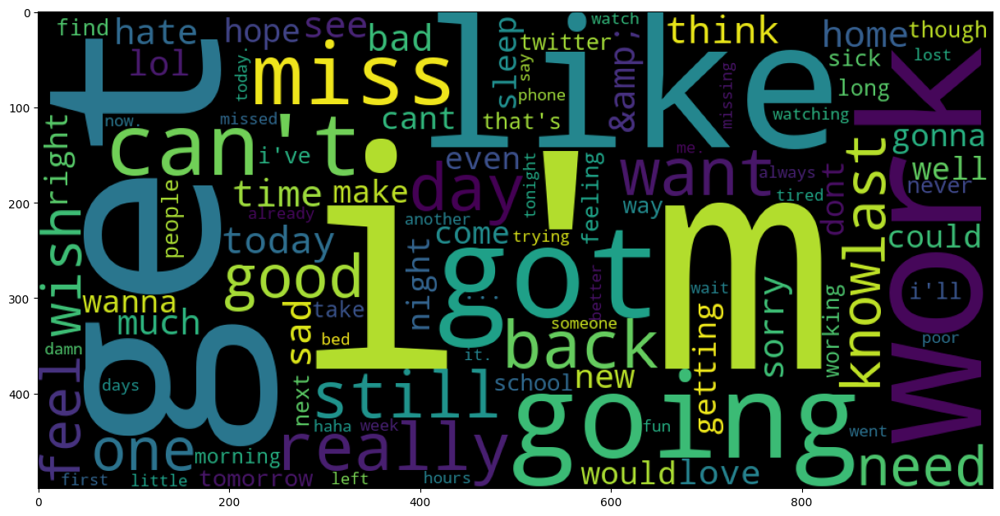

In [33]:
neg_dict = {}

for word in neg_list:
    if word in neg_dict:
        neg_dict[word]+=1
    else:
        neg_dict[word]=1
print(neg_dict)
neg_cloud2 = WordCloud(width = 1000, height = 500,max_words=100).generate_from_frequencies(neg_dict)

plt.figure(figsize=(15,8))
plt.imshow(neg_cloud2)

In [34]:
pos_df = df[df['target']==4]
pos_df

,target,text,tokens
800000,4,I LOVE @Health4UandPets u guys r the best!!,"[love, @, health4uandpets, u, guys, r, best, !..."
800001,4,im meeting up with one of my besties tonight! ...,"[im, meeting, one, besties, tonight, !, cant, ..."
800002,4,"@DaRealSunisaKim Thanks for the Twitter add, S...","[@, darealsunisakim, thanks, twitter, add, ,, ..."
800003,4,Being sick can be really cheap when it hurts t...,"[sick, really, cheap, hurts, much, eat, real, ..."
800004,4,@LovesBrooklyn2 he has that effect on everyone,"[@, lovesbrooklyn2, effect, everyone]"
...,...,...,...
1599995,4,Just woke up. Having no school is the best fee...,"[woke, ., school, best, feeling, ever]"
1599996,4,TheWDB.com - Very cool to hear old Walt interv...,"[thewdb.com, -, cool, hear, old, walt, intervi..."
1599997,4,Are you ready for your MoJo Makeover? Ask me f...,"[ready, mojo, makeover, ?, ask, details]"
1599998,4,Happy 38th Birthday to my boo of alll time!!! ...,"[happy, 38th, birthday, boo, alll, time, !, !,..."
